In [109]:
%cd ~/Dropbox

/Users/kyle/Dropbox


In [140]:
os.mkdir('re_v_fits')
os.chdir('re_v_fits')

In [146]:
m.observed.iloc[xx:xx+2, 1:-1].values

array([[ 0.98347107,  1.        ,  1.        ,  1.        ,  0.7       ,
         0.        ,  0.53168906,  0.55835735,  0.5717682 ,  0.5850984 ,
         0.61176137,  0.531992  ,  0.55840998,  0.571732  ,  0.57186375,
         0.60008888],
       [ 0.98347107,  1.        ,  1.        ,  1.        ,  0.7       ,
         0.1       ,  0.52383949,  0.55823604,  0.5717545 ,  0.58516851,
         0.6117595 ,  0.51612179,  0.54000723,  0.5518065 ,  0.57180179,
         0.60079579]])

In [135]:
df = df.where(df>0).dropna()

In [148]:
y = m.observed.iloc[xx:xx+2, 1:-1].values.flatten()

In [156]:
sstr = m.observed.iloc[xx, :].Cond

In [166]:
y = idx_c.loc['Go':'e90'].values

In [171]:
yhat = df.iloc[idx, :].values

In [179]:
y.astype(np.float)

array([ 0.94214876,  1.        ,  1.        ,  1.        ,  0.8       ,
        0.25      ,  0.5297838 ,  0.57187894,  0.5981225 ,  0.61175009,
        0.63842622,  0.53606576,  0.56057099,  0.58535   ,  0.60980386,
        0.6207557 ])

In [182]:
df = df.where(df>0).dropna()

for idx, idx_c in m.observed.iterrows():
      try:
            save_str = '_'.join([str(idx), idx_c['Cond'], 'pred'])
            y = idx_c.loc['Go':'e90'].values.astype(np.float)
            yhat = df.iloc[idx, :].values.astype(np.float)
            vis.plot_fits(y, yhat, kind='radd', save=True, savestr=save_str)
      except Exception:
            continue

In [112]:
df = pd.read_csv("fits.csv", index_col=0)
df[df>0].mean().valuesaa

array([ 0.95203567,  0.99966923,  0.96142758,  0.91743252,  0.51817711,
        0.13916353,  0.51011795,  0.53617474,  0.55711594,  0.57909422,
        0.61025117,  0.50130266,  0.53083561,  0.54870981,  0.56737718,
        0.59725808])

In [62]:
df['cond']=['bsl', 'pnl']*int((len(df)/2))
yhat = df[df>0].groupby('cond').mean().values[:, 1:]
m = build.Model(data=prodf_store.prodata, kind='xpro', fit_on='average', depends_on={'v':'pGo'})
df = pd.read_csv("fits.csv")
#yhat = df.mean().iloc[1:]
#for i in range(m.ncond):
yhat = yhat.reshape(2,16)
for i in range(m.ncond):
      vis.plot_fits(m.avg_y[i], yhat[i], kind='radd')

In [2]:
#!/usr/local/bin/env python
from __future__ import division
import time
from copy import deepcopy
import numpy as np
from numpy.random import random_sample as rs
from scipy.stats.mstats import mquantiles as mq
from radd import build, fit, vis

## Prepare Data/Params

In [5]:
data = redf_store['redata']
binits = { k: v for k, v in redf_store['rebsl_boot_popt'].items() }
binits['ssv'] = -abs(binits['ssv'])
pinits = { k: v for k, v in redf_store['repnl_boot_popt'].items() }

avg_inits = { k: np.mean([binits[k], pinits[k]]) for k in binits.keys() }
if 'ssd' in avg_inits.keys(): del avg_inits['ssd']

##Reactive

In [6]:
dirpath = pth+'ELife/Fits/TESTS'
if not os.path.isdir(dirpath):
      os.mkdir(dirpath)
os.chdir(dirpath)

data = redf_store['redata']
inits = dict(deepcopy(avg_inits))

In [111]:
m = build.Model(data=data, kind='xradd', fit_on='average', depends_on={'tr':'Cond'})


      Model is prepared to fit xradd model (w/ hyp dynamic bias) to average data,
      allowing Onset Time to vary across levels of Cond (bsl, pnl)

      It's IN the computer? 



In [23]:
m.inits

{'a': 0.4441, 'ssv': -0.9473, 'tr': 0.3049, 'v': 1.0919, 'xb': 1, 'z': 0.1542}

In [19]:
m.optimize(ntrials=2000, ftol=1.e-1, xtol=1.e-1, maxfev=100)

Optimization terminated successfully.
         Current function value: 0.008297
         Iterations: 1
         Function evaluations: 6
Optimization terminated successfully.
         Current function value: 0.029356
         Iterations: 1
         Function evaluations: 3


In [37]:
sns.set(rc={'text.color': 'black', 'axes.labelcolor': 'black', 'figure.facecolor': 'white'})

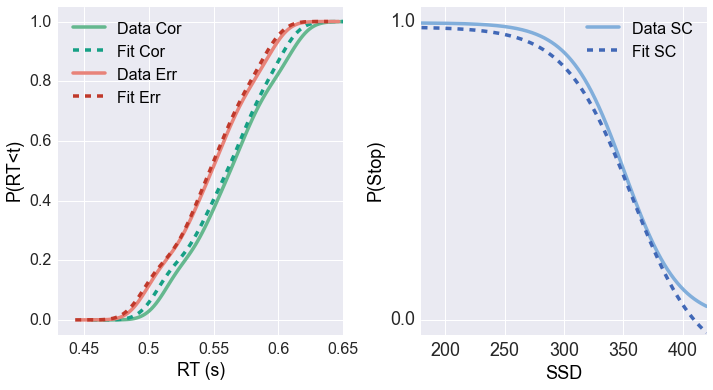

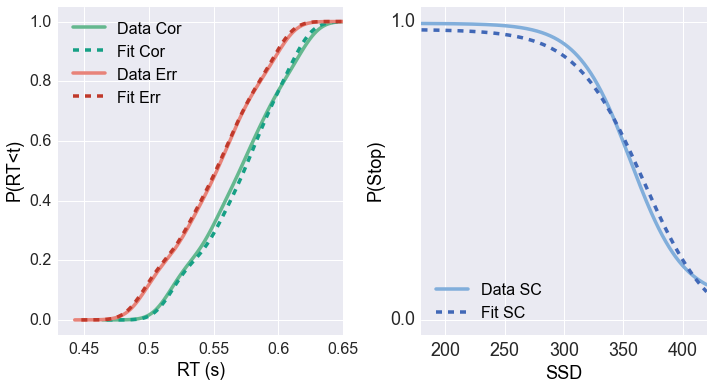

In [40]:
yhat = m.fits.reshape(2,16)
#yhat = m.fits.reshape(m.ncond, len(m.fits)/m.ncond)
for i in range(m.ncond):
      vis.plot_fits(m.avg_y[i], yhat[i], plot_acc=True)